In [6]:
import tarfile
from pathlib import Path

if Path("data").exists() == False:
    tar = tarfile.open("dentalData.tar")
    tar.extractall("data")
    tar.close()

# Dependencies

In [7]:
from torch.utils.data import Dataset
from pathlib import Path
from PIL import Image, ImageDraw
import numpy as np
import json


class DentalDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        super().__init__()

        self.data_dir = Path(data_dir)

        self.all_img_paths = list(data_dir.glob("test/img/*"))
        # self.all_mask_paths = list(data_dir.glob("train/ann/*"))
        self.transform = transform

    def __len__(self):
        return len(self.all_img_paths)


    def __getitem__(self, index):

        img_pth = self.all_img_paths[index]
        image = Image.open(img_pth)
        img_array = np.array(image)

        mask_path = self.data_dir / Path("test/ann") / Path(f"{img_pth.name}.json")

        with open(mask_path, 'rb') as file:
            masks = json.load(file)
            masks = masks["objects"]

        raw_mask = Image.new('L', img_array.shape[:-1][::-1], 0)

        for tooth in masks:
            pts = tooth["points"]["exterior"]
            ImageDraw.Draw(raw_mask).polygon(pts, outline=1, fill=1)

        if self.transform != None:

            img_array, raw_mask = self.transform(img_array, raw_mask)

        return (img_array, raw_mask)


In [8]:
import torch
from torch import nn
import torchvision

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

        )

    def forward(self, x : torch.Tensor):
        return self.conv(x)


class UNET(nn.Module):

    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super().__init__()

        self.downs = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=(2, 2), stride=2)

        for feature in features:
            self.downs.append(
                DoubleConv(in_channels, feature)
            )
            in_channels = feature

        for feature in reversed(features):
            self.ups.append(
                    nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2)
                    )
            self.ups.append(DoubleConv(in_channels=feature*2, out_channels=feature))

        self.bottleneck = DoubleConv(features[-1], out_channels=features[-1]*2)

        self.final_conv = nn.Conv2d(features[0], out_channels=out_channels, kernel_size=3, padding=1, stride=1)


    def forward(self, x : torch.Tensor):
        skip_connections : list[torch.Tensor] = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)

        skip_connections = skip_connections[::-1]


        for i in range(0, len(self.ups), 2):
            x = self.ups[i](x)

            if x.shape != skip_connections[i//2].shape:
                x = torchvision.transforms.Resize(skip_connections[i//2].shape[2:])(x)

            concat_skip = torch.cat([x, skip_connections[i//2]], dim=1)
            x = self.ups[i+1](concat_skip)

        return self.final_conv(x)

In [9]:
from torchvision.transforms import v2

def train_transforms(img, mask):

    def get_random():
        return torch.rand(1).item()

    img = v2.ToImage()(img)
    mask = v2.ToImage()(mask)

    img = v2.Resize((160, 240))(img)
    mask = v2.Resize((160, 240))(mask)

    if get_random() > 0.5:
        img = v2.RandomHorizontalFlip(p=1)(img)
        mask = v2.RandomHorizontalFlip(p=1)(mask)

    if get_random() > 0.5:
        img = v2.RandomVerticalFlip(p=1)(img)
        mask = v2.RandomVerticalFlip(p=1)(mask)

    img = v2.ToDtype(torch.float32, scale=True)(img)
    mask = v2.ToDtype(torch.float32, scale=True)(mask)

    return (img, mask)

test_data = DentalDataset(data_dir=Path('data'), transform=train_transforms)

# Inference on Test Data

Ineference Time :  0.1834798000054434


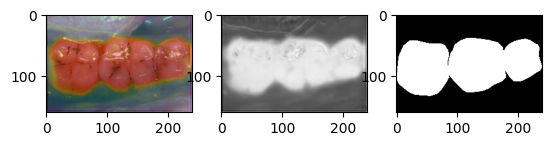

Ineference Time :  0.2099614000035217


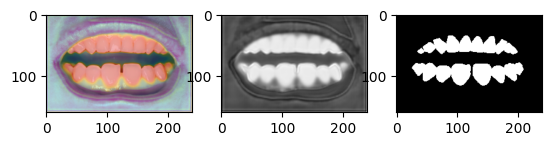

Ineference Time :  0.18419189999985974


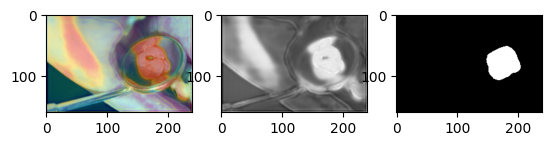

Ineference Time :  0.18136069999309257


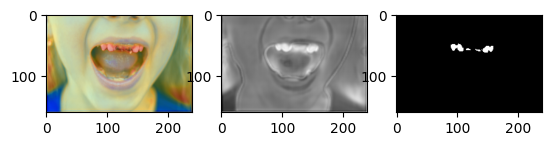

Ineference Time :  0.20150770001055207


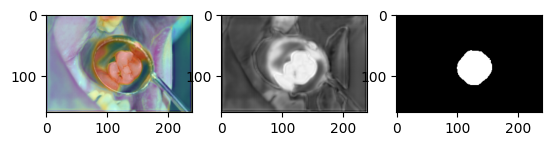

Ineference Time :  0.21098709999932908


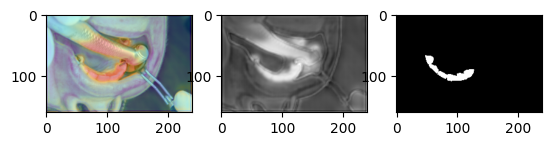

Ineference Time :  0.2113927999889711


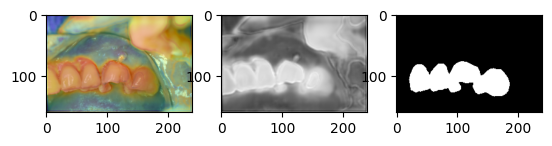

Ineference Time :  0.1798360000102548


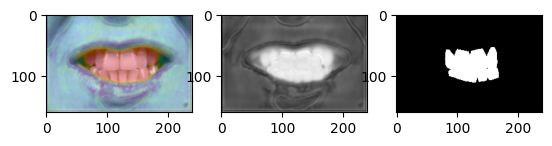

Ineference Time :  0.18979740000213496


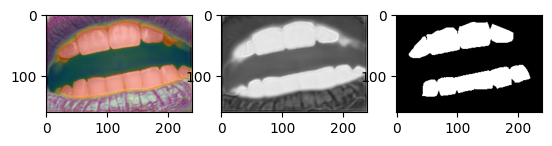

Ineference Time :  0.17950490000657737


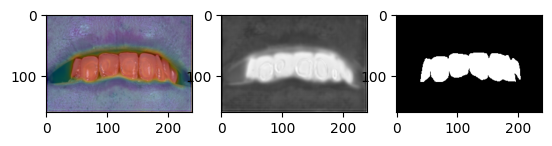

Ineference Time :  0.18952790000184905


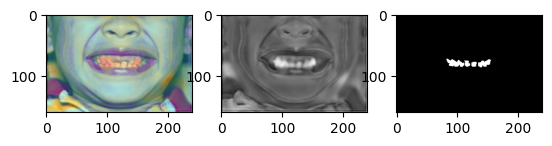

Ineference Time :  0.18314180000743363


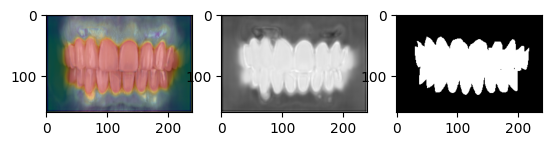

Ineference Time :  0.18789420000393875


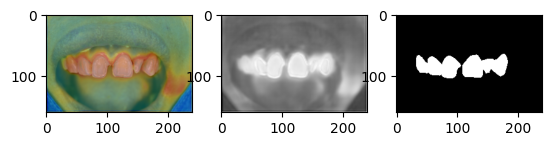

Ineference Time :  0.17645230000198353


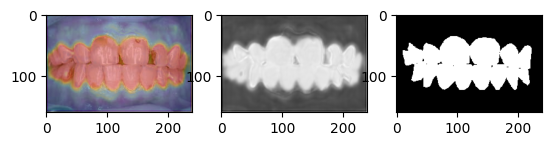

Ineference Time :  0.1723310999950627


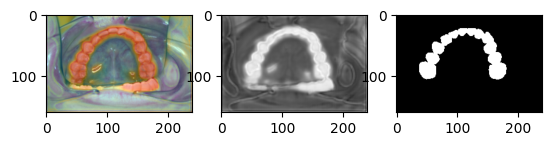

Ineference Time :  0.16745359999185894


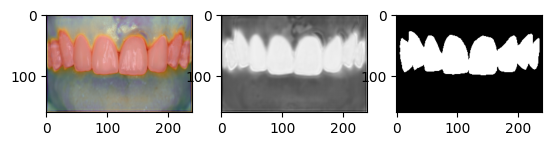

Ineference Time :  0.2003722000081325


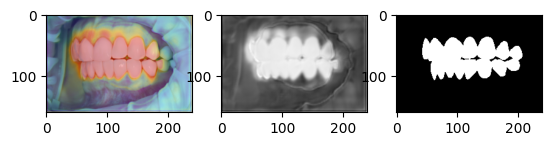

Ineference Time :  0.18095150000590365


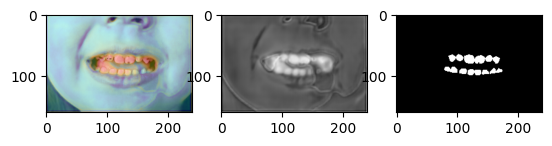

Ineference Time :  0.16630450000229757


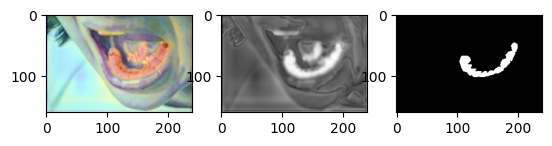

Ineference Time :  0.17509489999793004


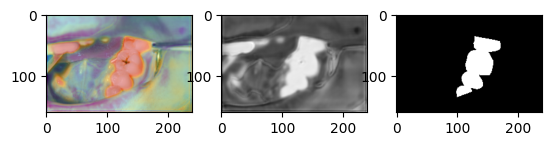

Ineference Time :  0.1696181000006618


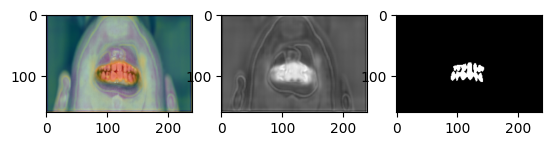

Ineference Time :  0.1754955000069458


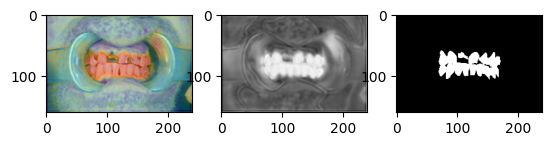

Ineference Time :  0.1680287000053795


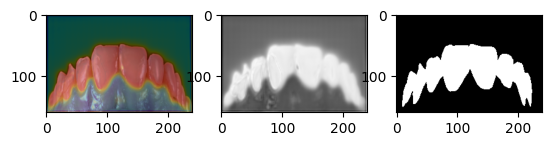

Ineference Time :  0.17047830000228714


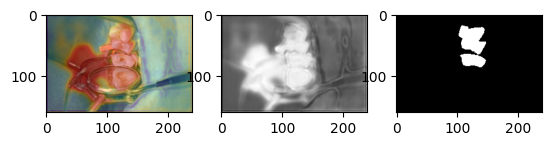

Ineference Time :  0.17622880000271834


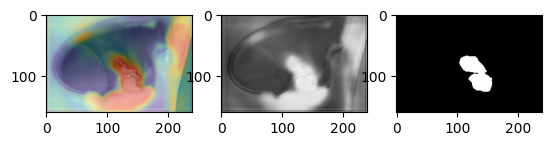

Ineference Time :  0.16756449999229517


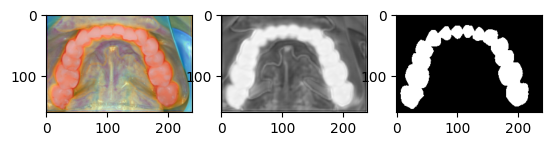

Ineference Time :  0.17362669999420177


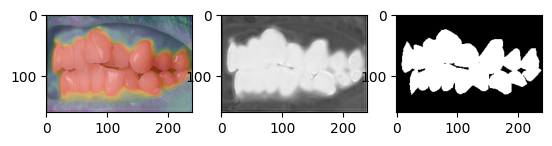

Ineference Time :  0.1707146999979159


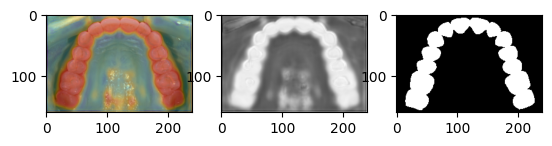

Ineference Time :  0.17904250000719912


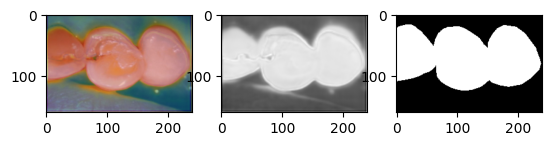

Ineference Time :  0.1669467000028817


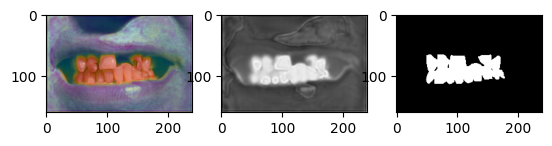

Ineference Time :  0.1669916000100784


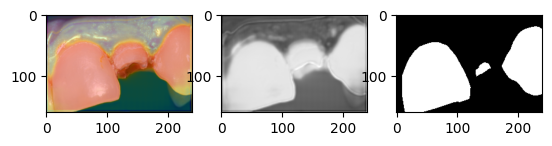

Ineference Time :  0.16828959999838844


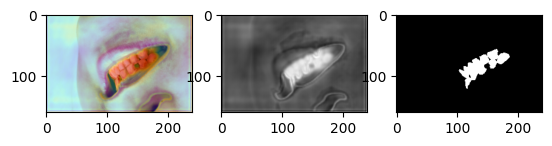

Ineference Time :  0.16568779999215622


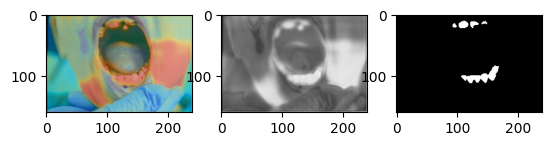

Ineference Time :  0.17325750000600237


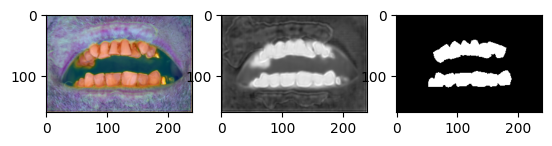

Ineference Time :  0.17029409999668133


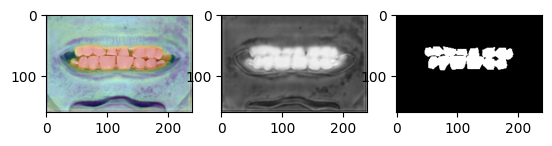

Ineference Time :  0.16732029999548104


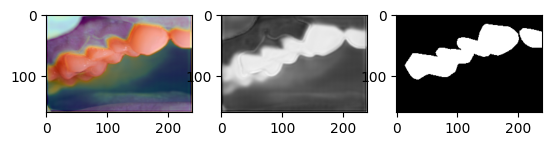

Ineference Time :  0.184035699989181


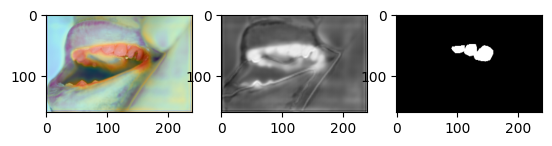

Ineference Time :  0.18301540000538807


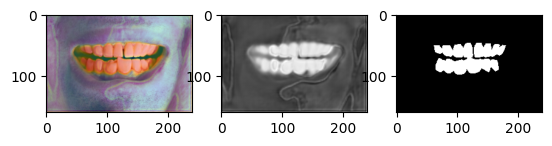

Ineference Time :  0.16903720000118483


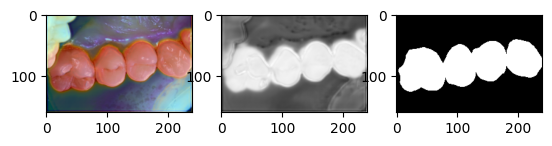

Ineference Time :  0.18311810000159312


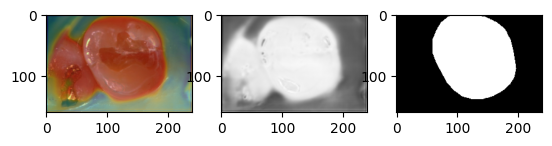

Ineference Time :  0.17256179999094456


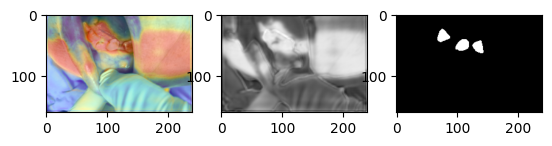

Ineference Time :  0.1772040000068955


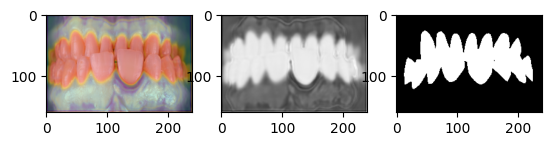

Ineference Time :  0.16516290001163725


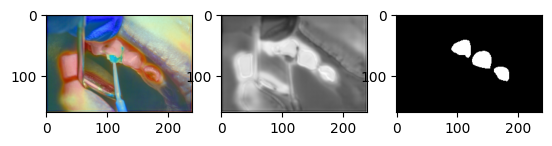

Ineference Time :  0.1852705000055721


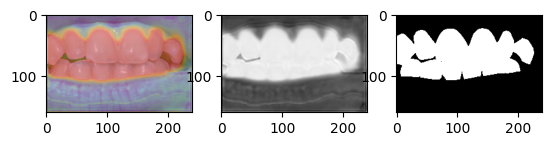

Ineference Time :  0.1994501000008313


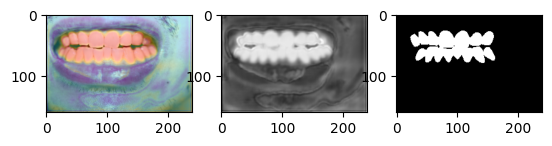

Ineference Time :  0.18908949999604374


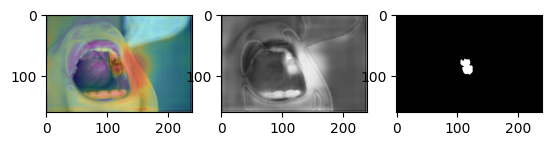

Ineference Time :  0.1701186999998754


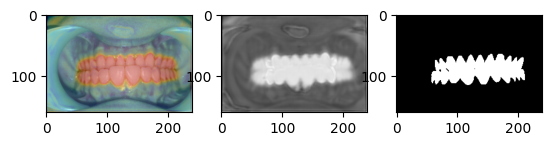

Ineference Time :  0.1684365999972215


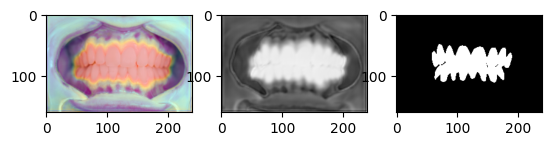

Ineference Time :  0.1668173000070965


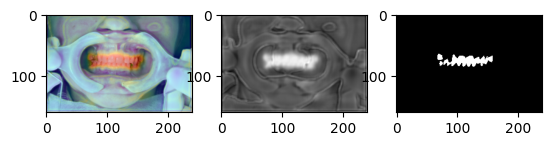

Ineference Time :  0.1726870999991661


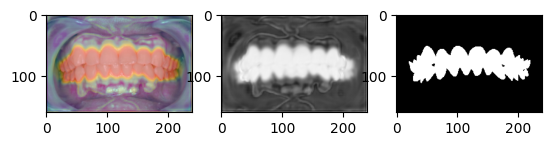

Ineference Time :  0.18030990000988822


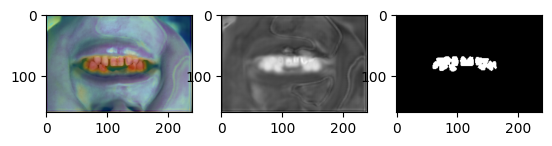

Ineference Time :  0.20111010000982787


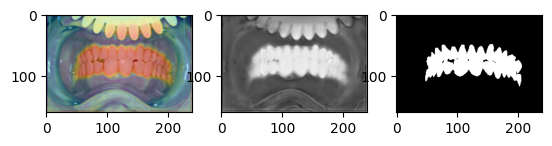

Ineference Time :  0.1846050999884028


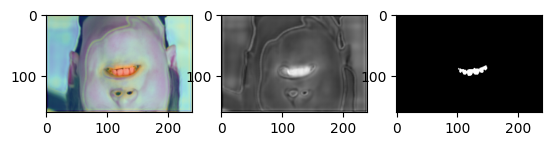

Ineference Time :  0.19182190000719856


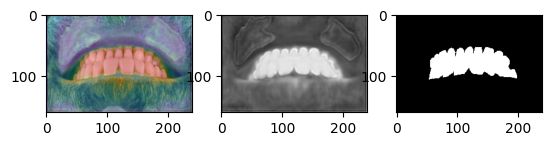

Ineference Time :  0.17938349999894854


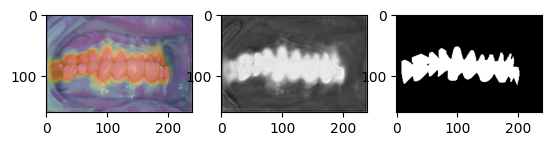

Ineference Time :  0.17571070000121836


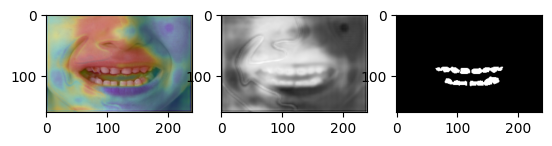

Ineference Time :  0.1714365999941947


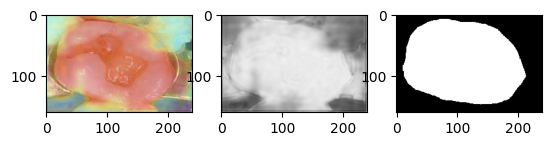

Ineference Time :  0.17834479999146424


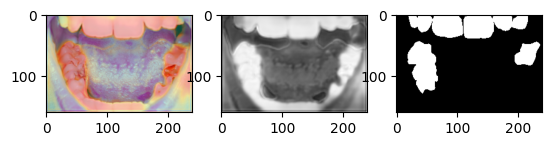

Ineference Time :  0.18664139999600593


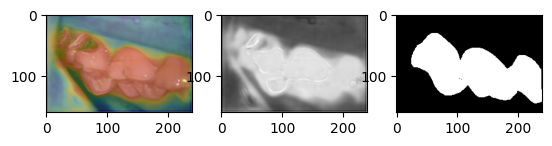

Ineference Time :  0.16690130000642966


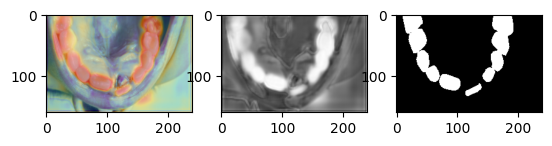

Ineference Time :  0.1681811999878846


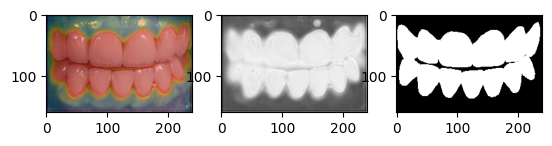

Ineference Time :  0.17783240000426304


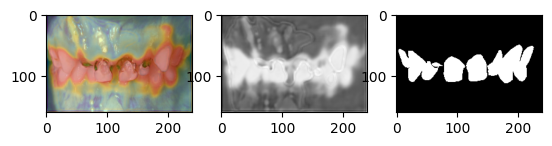

Ineference Time :  0.17481529999349732


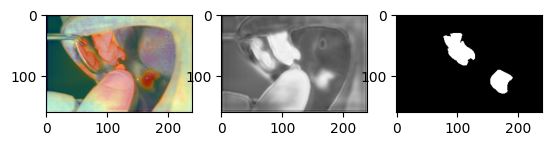

Ineference Time :  0.18629840000357945


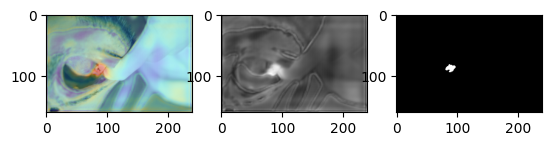

Ineference Time :  0.1744128999998793


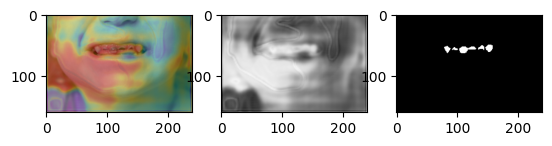

Ineference Time :  0.17309360000945162


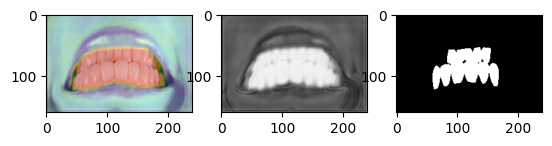

Ineference Time :  0.16479210001125466


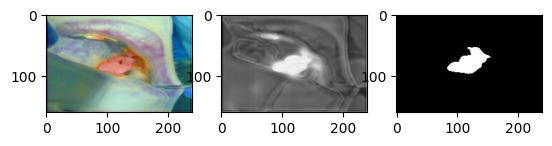

Ineference Time :  0.1786914000113029


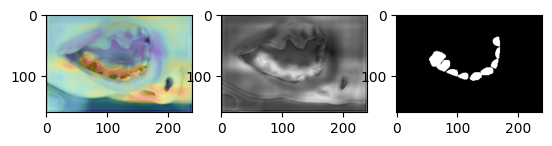

Ineference Time :  0.18035049999889452


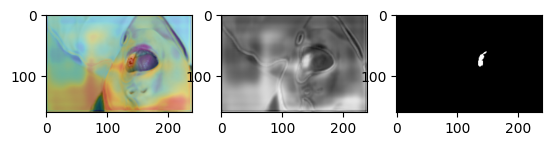

Ineference Time :  0.17566619999706745


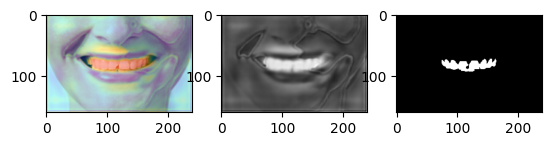

Ineference Time :  0.16499309999926481


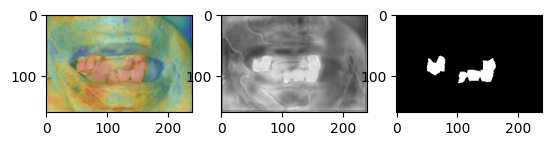

Ineference Time :  0.17102100000192877


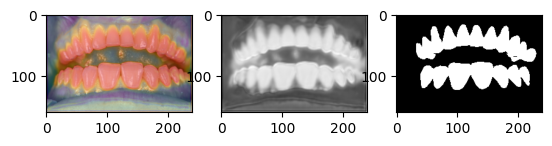

Ineference Time :  0.19529350000084378


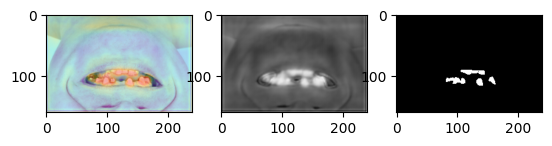

Ineference Time :  0.17776819999562576


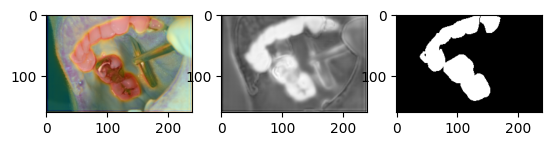

Ineference Time :  0.17071649999707006


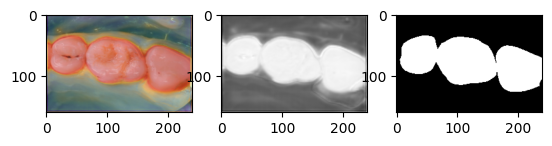

Ineference Time :  0.16803319999598898


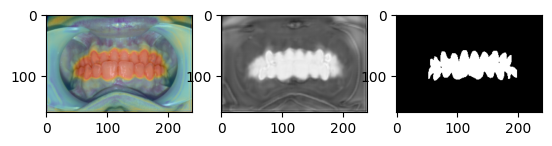

Ineference Time :  0.1711873000022024


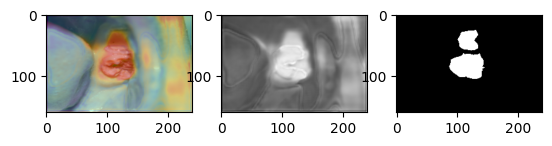

Ineference Time :  0.17470040000625886


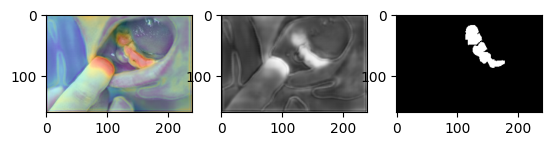

Ineference Time :  0.19681199999467935


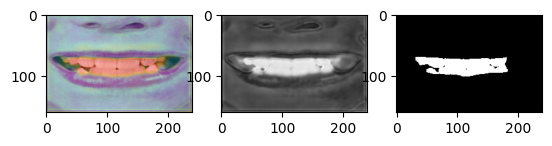

Ineference Time :  0.18276779999723658


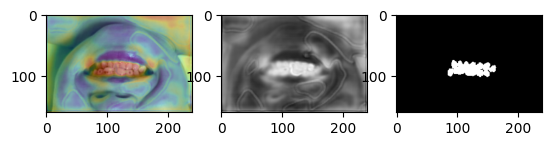

Ineference Time :  0.19117789999290835


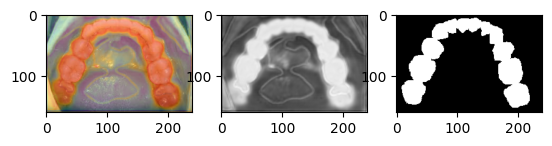

Ineference Time :  0.17920599998615216


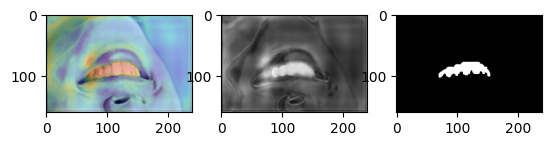

Ineference Time :  0.17114769999170676


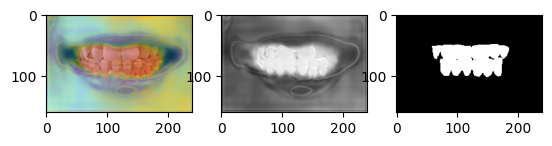

Ineference Time :  0.19450769999821205


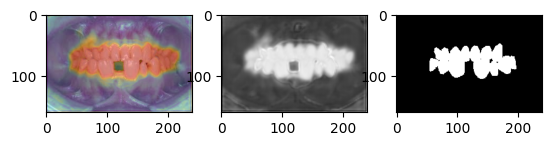

Ineference Time :  0.18760450000991113


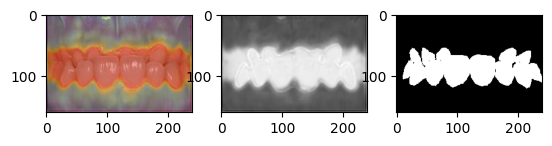

Ineference Time :  0.21379850000084843


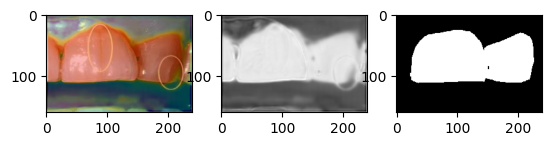

Ineference Time :  0.2020226000022376


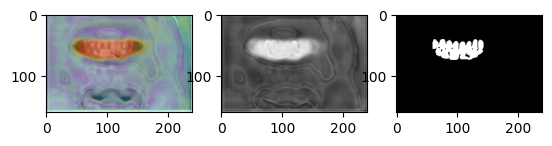

Ineference Time :  0.1933915999979945


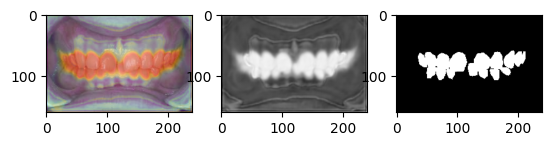

Ineference Time :  0.17582420000690036


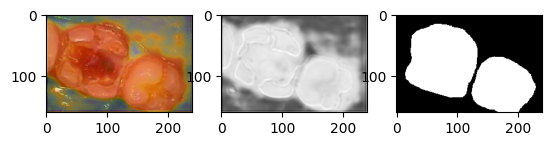

Ineference Time :  0.1839888999966206


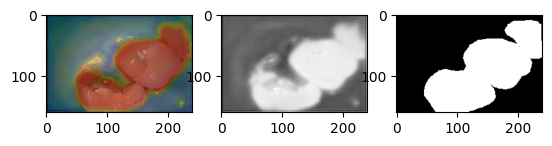

Ineference Time :  0.20092890001251362


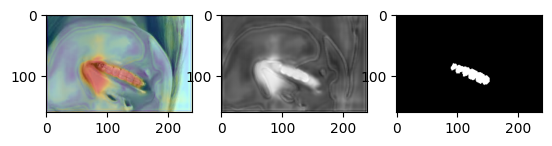

Ineference Time :  0.20997669998905621


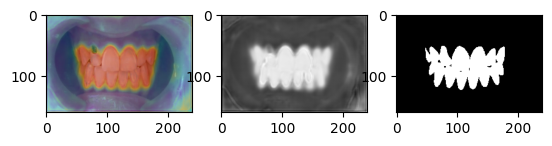

Ineference Time :  0.16953850000572857


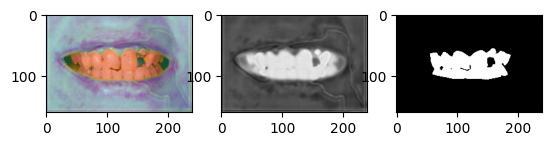

Ineference Time :  0.17759079999814276


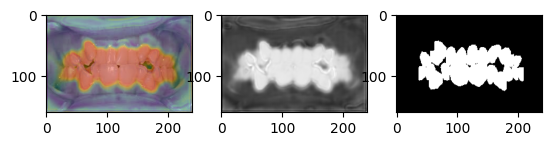

Ineference Time :  0.19445009999617469


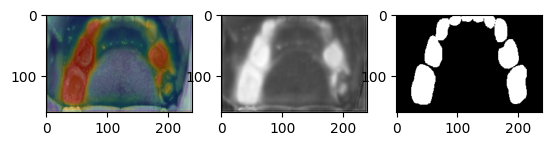

Ineference Time :  0.18257039999298286


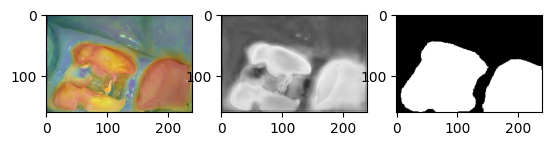

Ineference Time :  0.20292379999591503


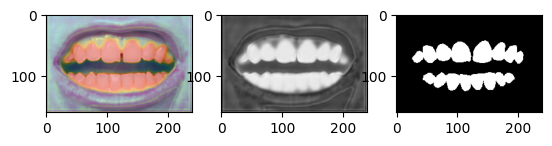

Ineference Time :  0.19827310000255238


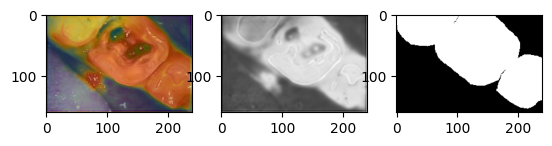

Ineference Time :  0.19203099999867845


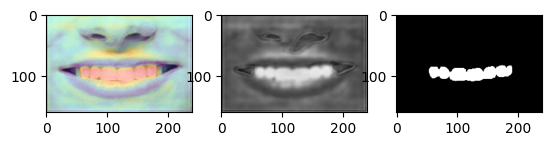

Ineference Time :  0.17944799999531824


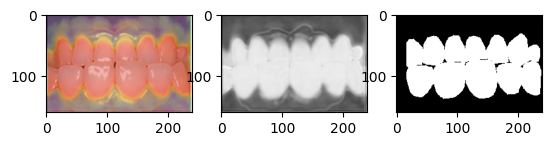

Ineference Time :  0.1906241999968188


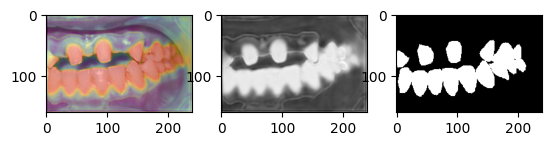

Ineference Time :  0.18526859999110457


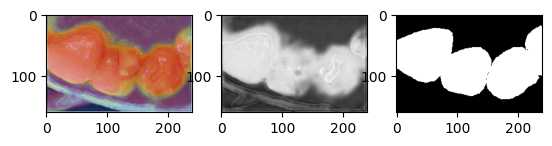

Ineference Time :  0.18569250000291504


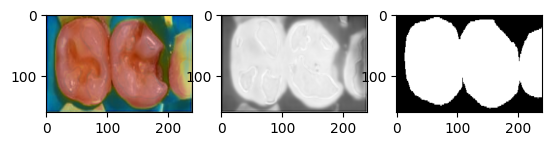

Ineference Time :  0.20527380000567064


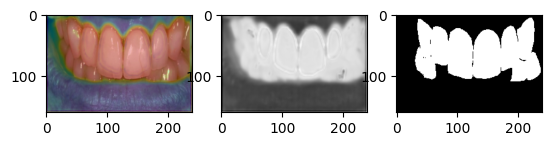

Ineference Time :  0.19700999998894986


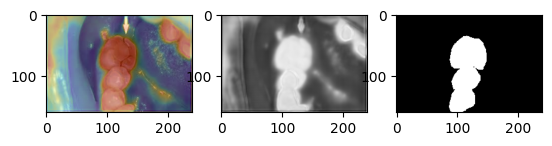

Ineference Time :  0.17700900000636466


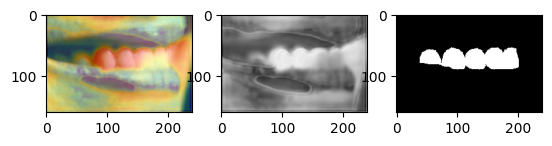

Ineference Time :  0.18938619999971706


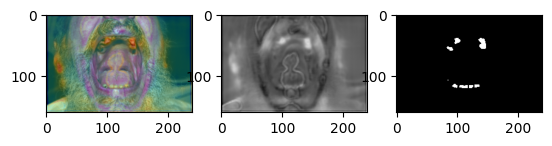

Ineference Time :  0.18414349999511614


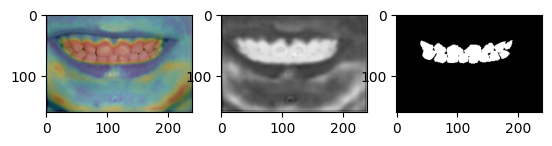

Ineference Time :  0.18825150000338908


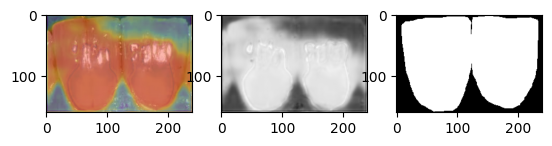

Ineference Time :  0.2026478999905521


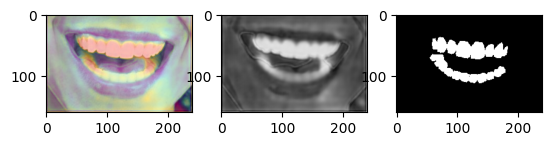

Ineference Time :  0.1955996999895433


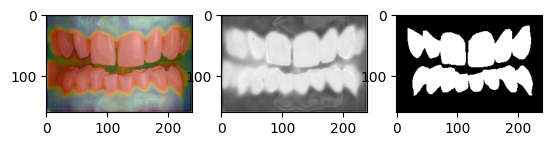

Ineference Time :  0.23683670000173151


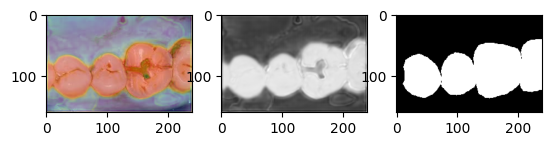

Ineference Time :  0.19727760000387207


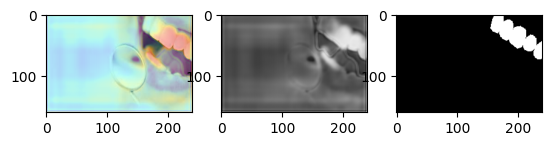

Ineference Time :  0.1932775000022957


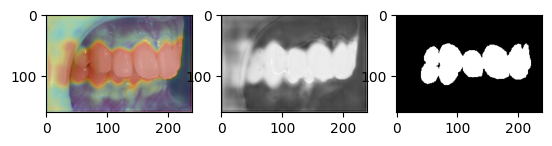

Ineference Time :  0.19293820000893902


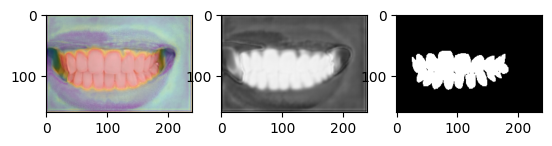

Ineference Time :  0.19117520000145305


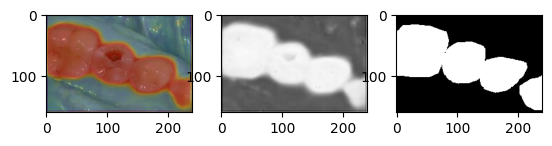

Ineference Time :  0.16714420000789687


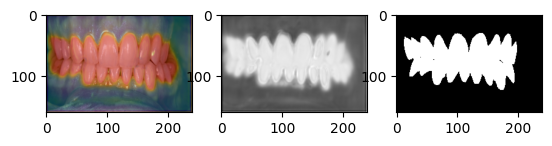

Ineference Time :  0.18065650000062305


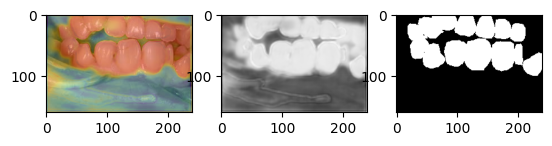

Ineference Time :  0.1955619999935152


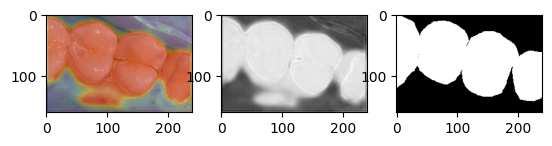

Ineference Time :  0.1987885999988066


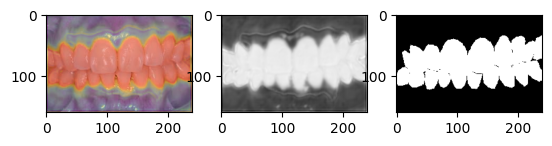

Ineference Time :  0.1966729999985546


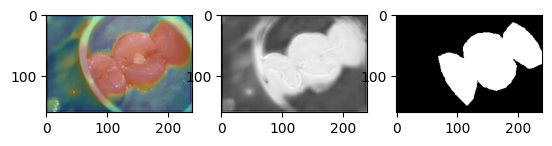

Ineference Time :  0.18741909999516793


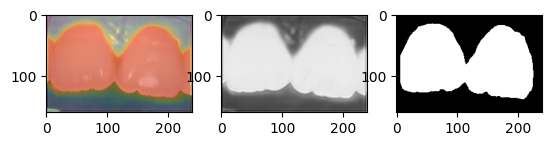

Ineference Time :  0.1867156999942381


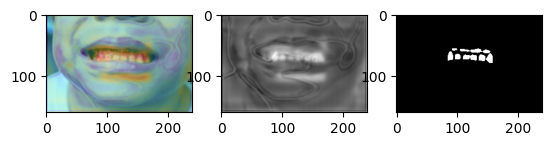

Ineference Time :  0.19256129999121185


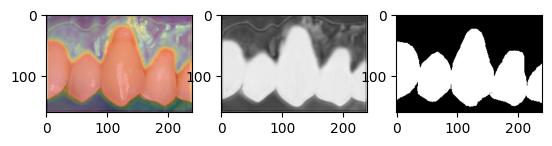

Ineference Time :  0.1848805000045104


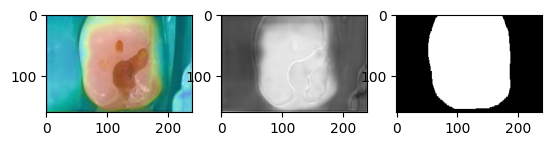

Ineference Time :  0.19497989999945275


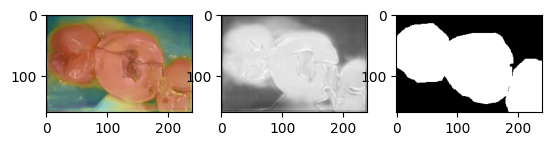

Ineference Time :  0.2038782000017818


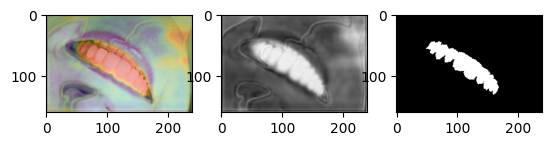

Ineference Time :  0.20531549998850096


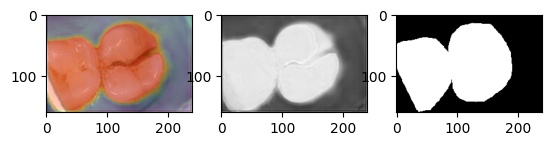

Ineference Time :  0.20408759999554604


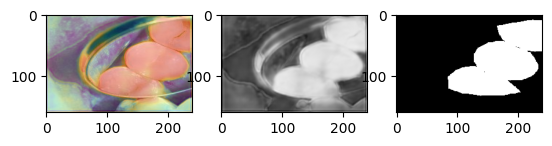

Ineference Time :  0.18974380000145175


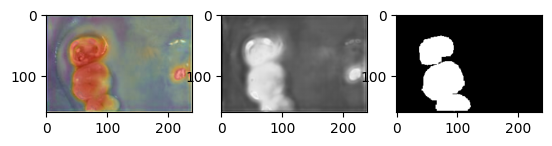

Ineference Time :  0.19485169999825303


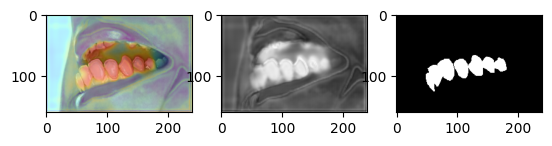

Ineference Time :  0.16772250000212807


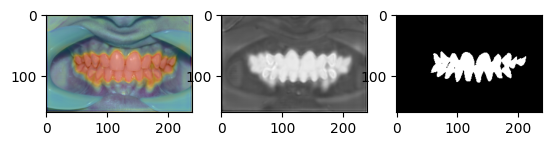

Ineference Time :  0.168271199989249


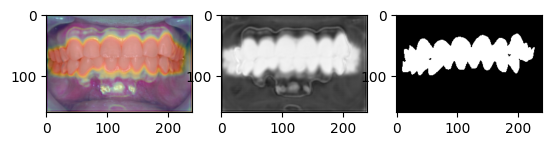

Ineference Time :  0.1767727999977069


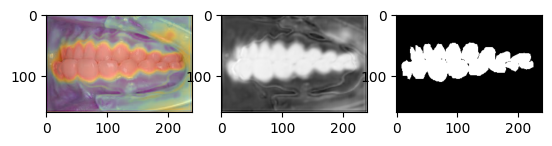

Ineference Time :  0.18398079999315087


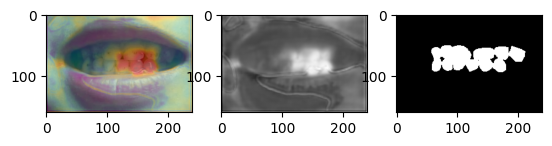

Ineference Time :  0.21592599998984952


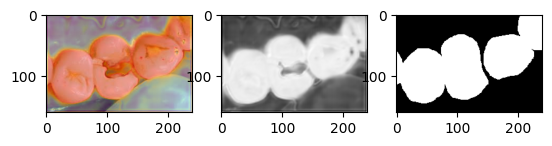

Ineference Time :  0.1979704999976093


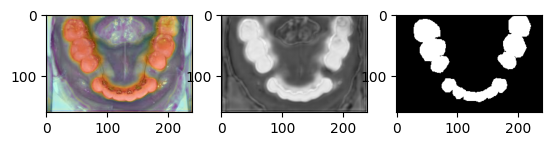

Ineference Time :  0.19042090000584722


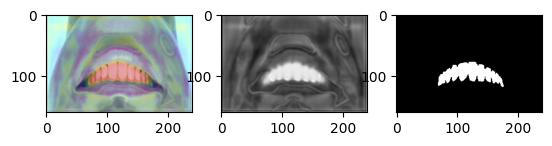

Ineference Time :  0.18507639999734238


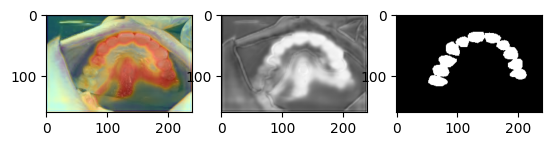

Ineference Time :  0.1971336999995401


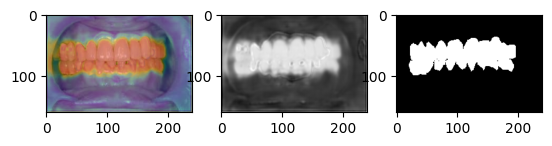

Ineference Time :  0.18900670000584796


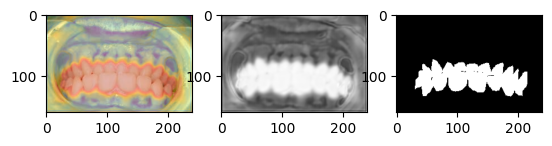

Ineference Time :  0.19653099999413826


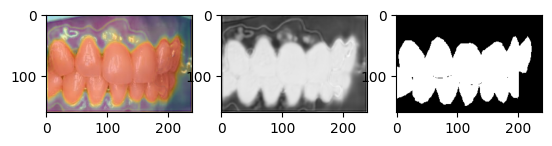

Ineference Time :  0.190219199997955


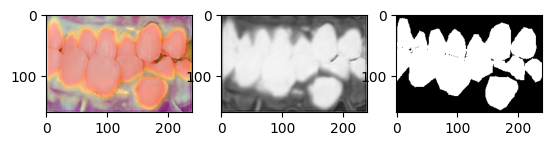

Ineference Time :  0.20286320000013802


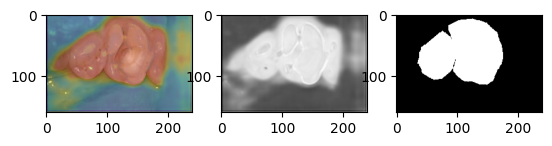

Ineference Time :  0.19625019999512006


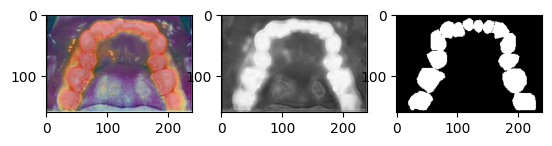

Ineference Time :  0.19119290000526235


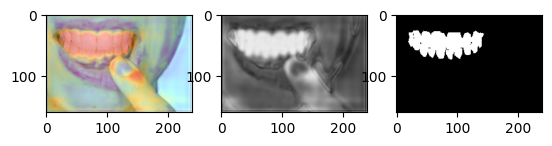

Ineference Time :  0.1940570999868214


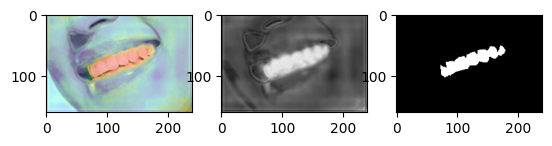

Ineference Time :  0.1862228999962099


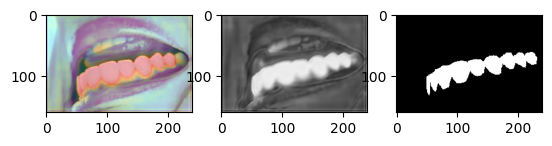

Ineference Time :  0.19650279999768827


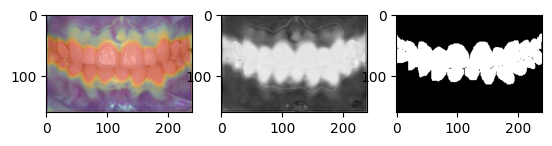

Ineference Time :  0.1907430999999633


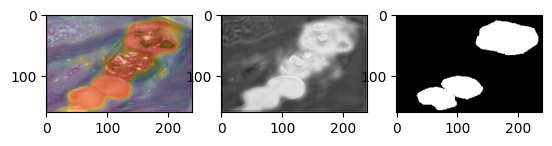

Ineference Time :  0.2210956999915652


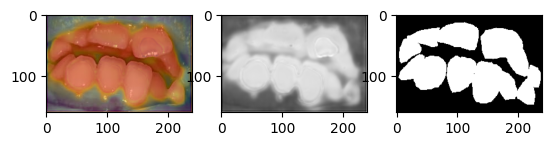

Ineference Time :  0.19565620001230855


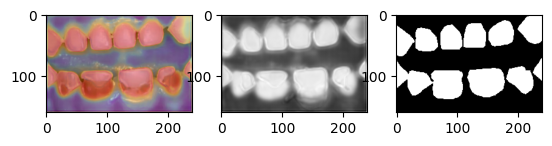

Ineference Time :  0.18162619999202434


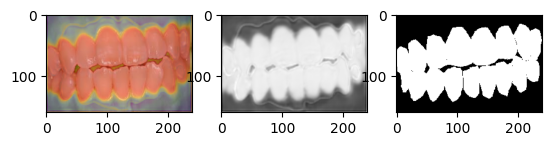

Ineference Time :  0.19923670000571292


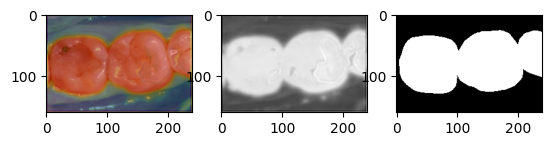

Ineference Time :  0.20080160000361502


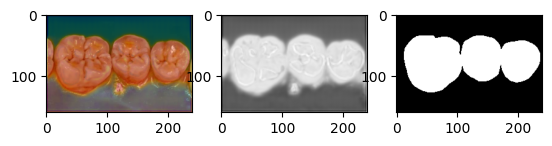

Ineference Time :  0.18932309999945574


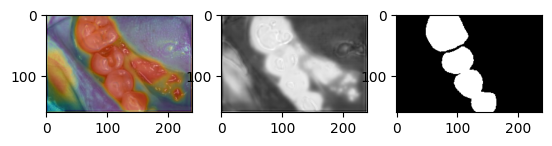

Ineference Time :  0.18588679999811575


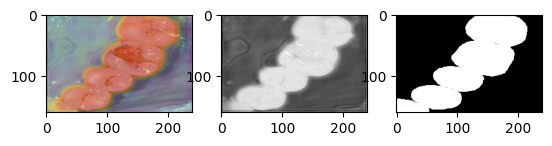

Ineference Time :  0.17170000000623986


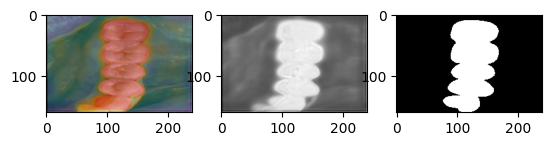

Ineference Time :  0.19377969999914058


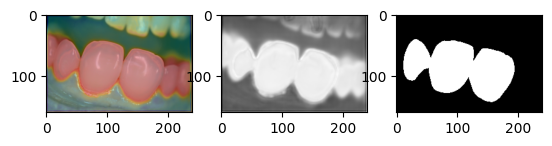

Ineference Time :  0.22911939999903552


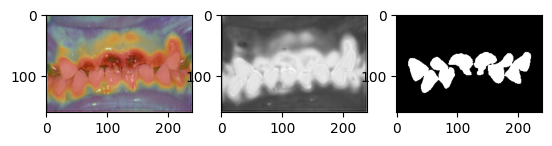

Ineference Time :  0.20984250000037719


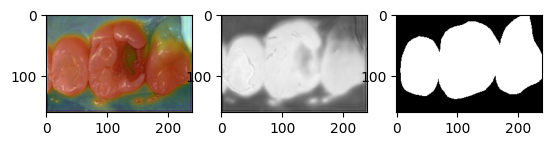

Ineference Time :  0.18886570000904612


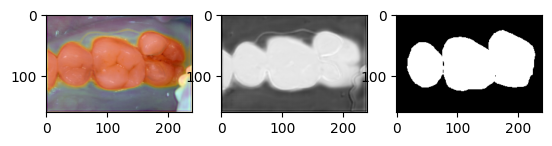

Ineference Time :  0.196542399993632


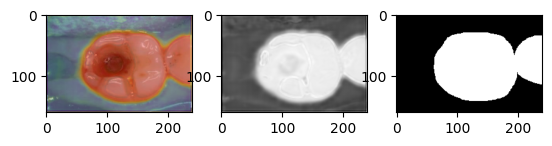

Ineference Time :  0.18102010000438895


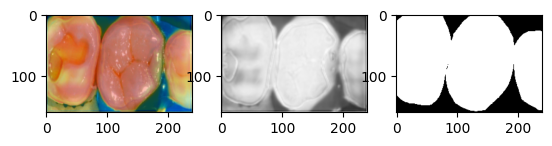

Ineference Time :  0.18355159999919124


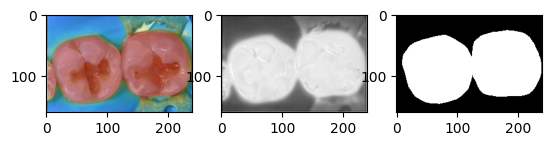

Ineference Time :  0.19430439999268856


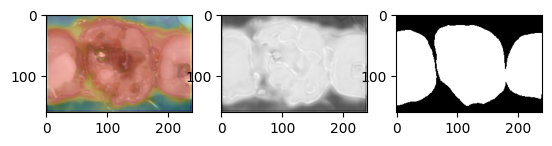

Ineference Time :  0.19636869999521878


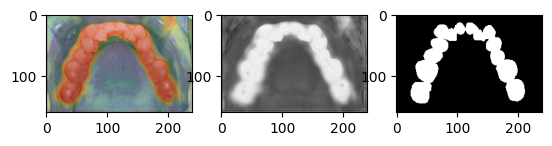

Ineference Time :  0.20225059999211226


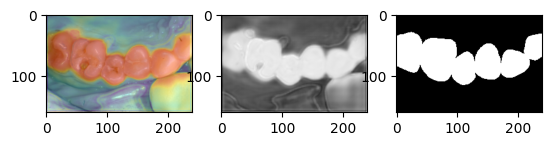

Ineference Time :  0.20540069999697153


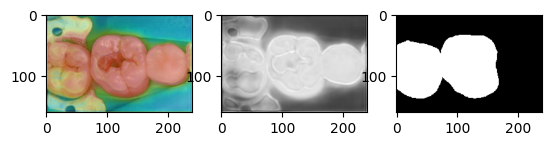

Ineference Time :  0.2026126000127988


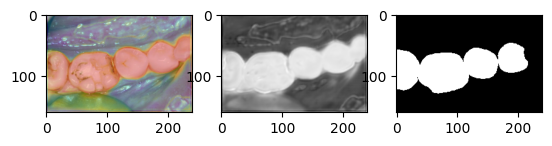

Ineference Time :  0.1873055000032764


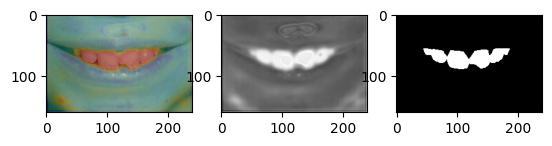

Ineference Time :  0.20185179999680258


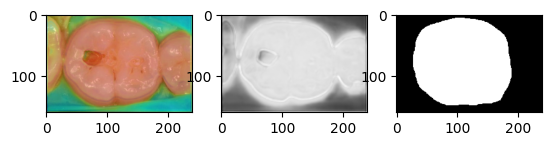

Ineference Time :  0.1943165999982739


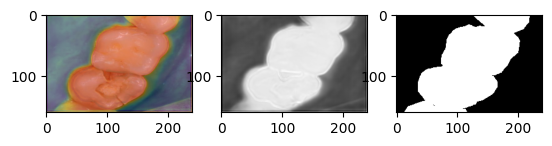

Ineference Time :  0.17438290000427514


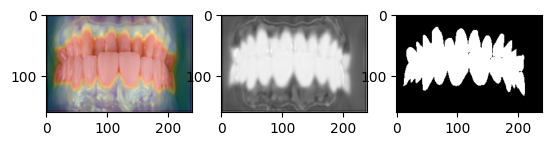

Ineference Time :  0.1794077000085963


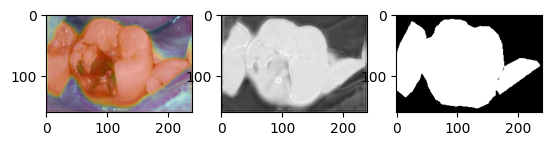

Ineference Time :  0.1836990000010701


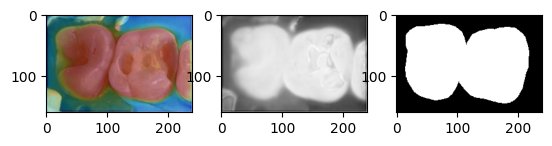

Ineference Time :  0.19786780000140425


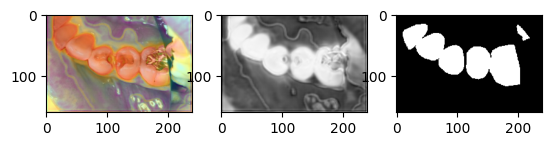

Ineference Time :  0.18502409999200609


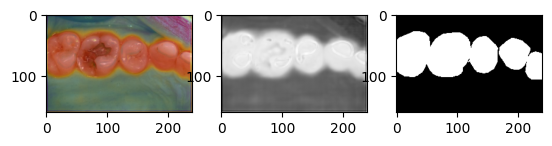

Ineference Time :  0.19172709999838844


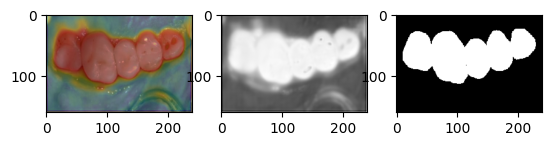

Ineference Time :  0.21784659998957068


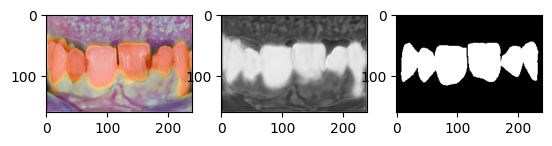

Ineference Time :  0.19448149998788722


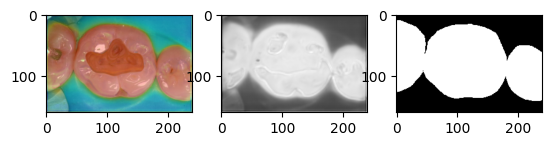

Ineference Time :  0.18755410000449046


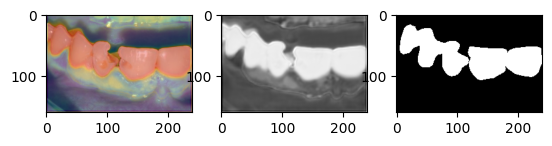

Ineference Time :  0.1902336000057403


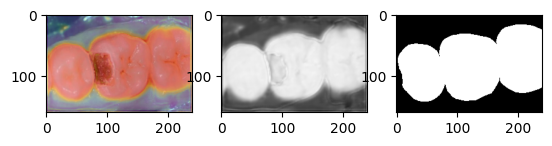

Ineference Time :  0.1958710000035353


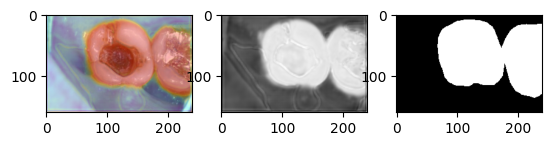

Ineference Time :  0.19643600001290906


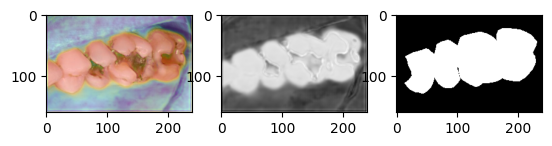

Ineference Time :  0.2096459999884246


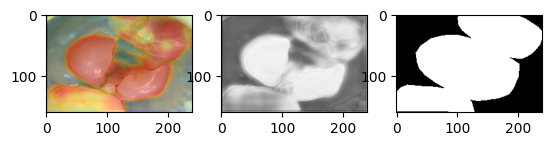

Ineference Time :  0.20318959999713115


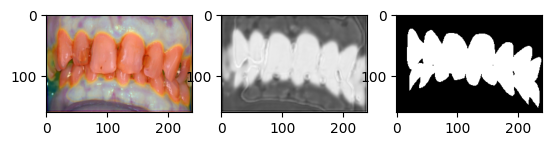

Ineference Time :  0.21330639999359846


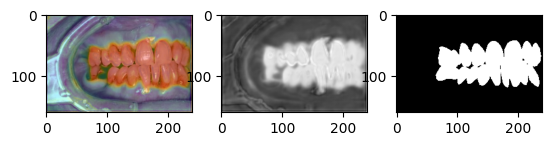

Ineference Time :  0.19718070000817534


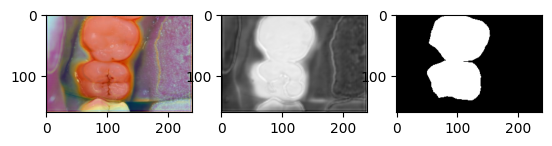

Ineference Time :  0.17339589999755844


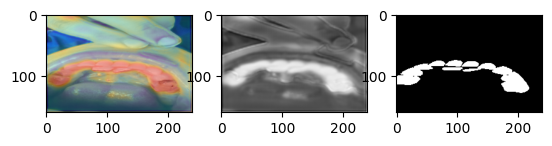

Ineference Time :  0.18124770000576973


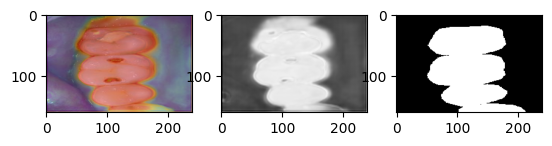

Ineference Time :  0.19946010000421666


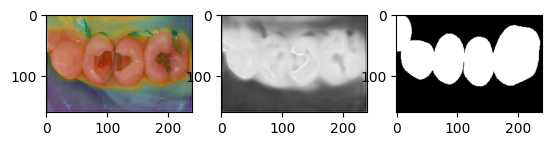

Ineference Time :  0.1997609999962151


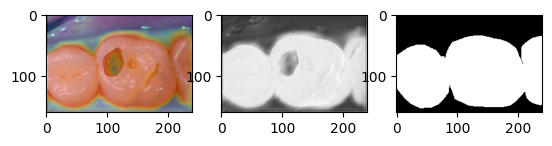

Ineference Time :  0.19440010000835173


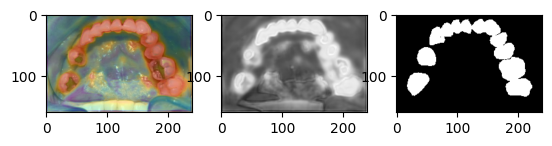

Ineference Time :  0.1785407999996096


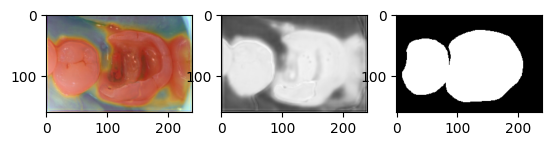

Ineference Time :  0.19937850000860635


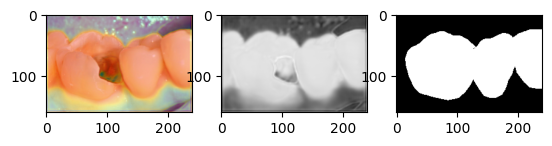

Ineference Time :  0.18855800000892486


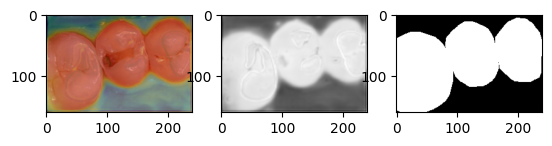

Ineference Time :  0.16680059999634977


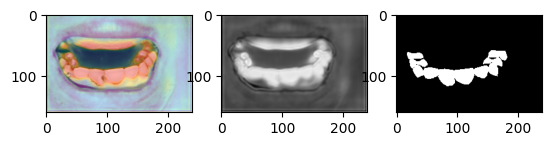

Ineference Time :  0.1768895999994129


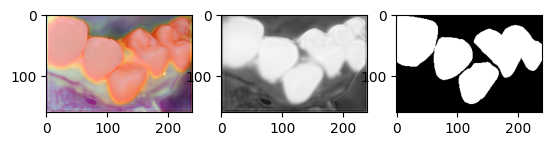

Ineference Time :  0.1794577999971807


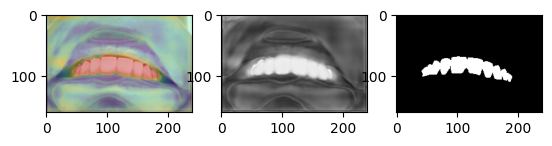

Ineference Time :  0.19998610000766348


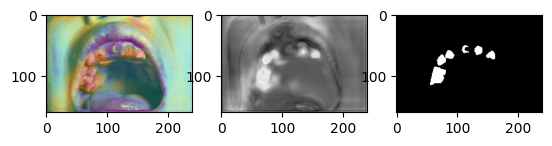

Ineference Time :  0.1683742000022903


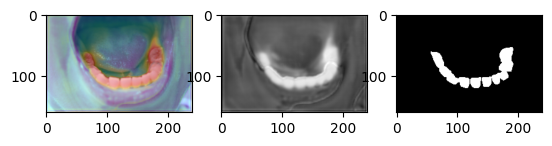

Ineference Time :  0.19380429999728221


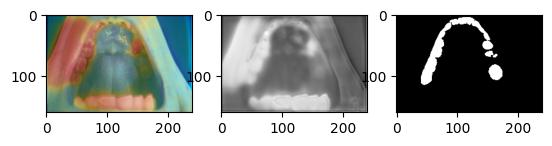

Ineference Time :  0.16395499999634922


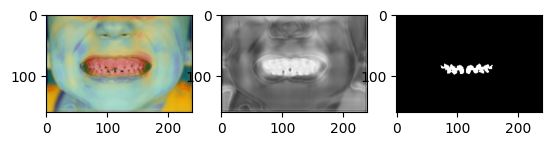

Ineference Time :  0.19077240000478923


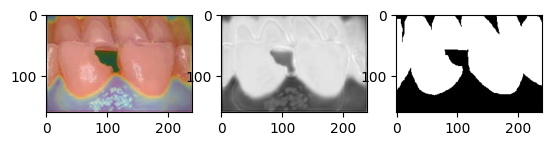

Ineference Time :  0.16810099998838268


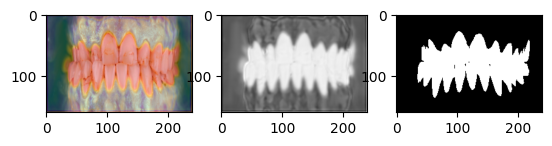

Ineference Time :  0.19506230000115465


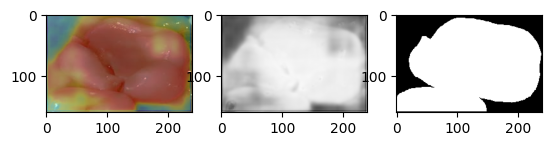

Ineference Time :  0.18722439999692142


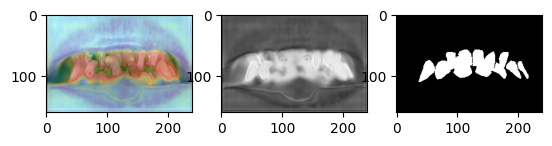

Ineference Time :  0.17384879999735858


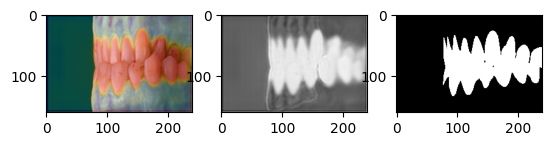

Ineference Time :  0.1977272000076482


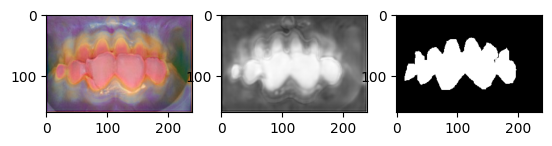

Ineference Time :  0.16784270000061952


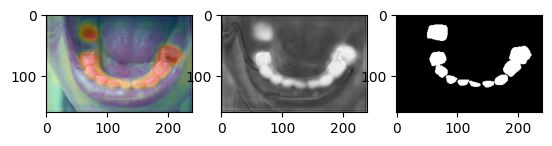

Ineference Time :  0.2025458999996772


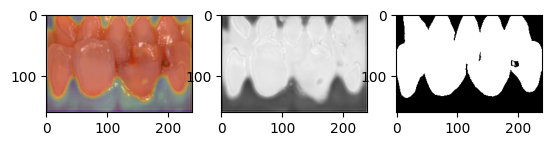

Ineference Time :  0.1727116000110982


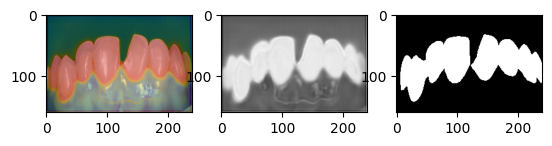

Ineference Time :  0.18241900000430178


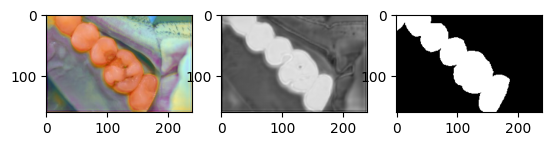

Ineference Time :  0.20693800000299234


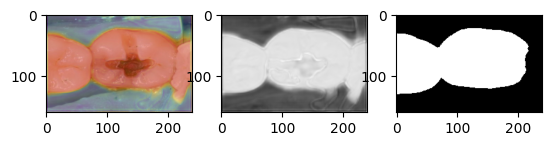

Ineference Time :  0.17534950000117533


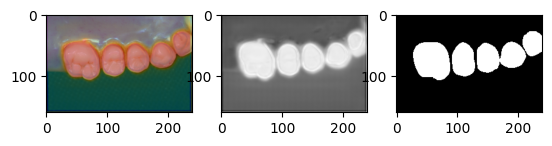

Ineference Time :  0.1909620999940671


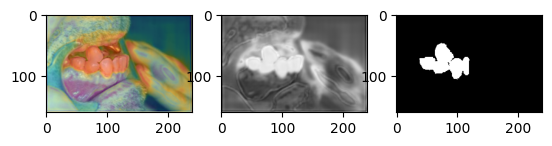

Ineference Time :  0.20197100000223145


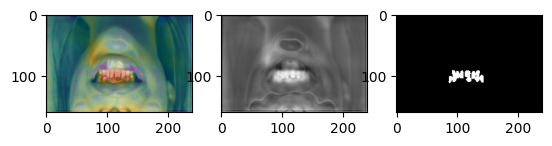

Ineference Time :  0.20783970000047702


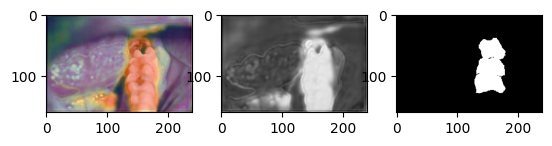

Ineference Time :  0.18555389999528416


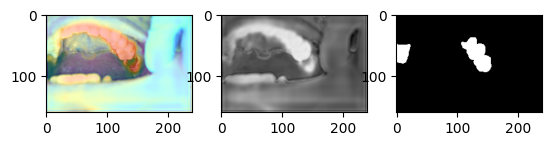

Ineference Time :  0.17863450000004377


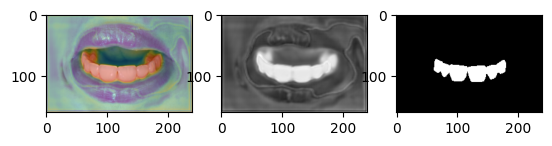

Ineference Time :  0.1761358000076143


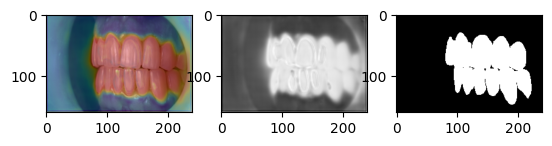

Ineference Time :  0.17429040001297835


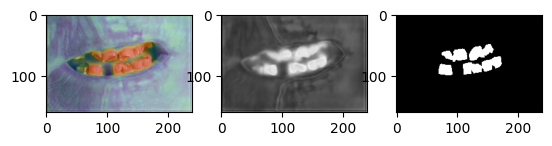

Ineference Time :  0.16955439999583177


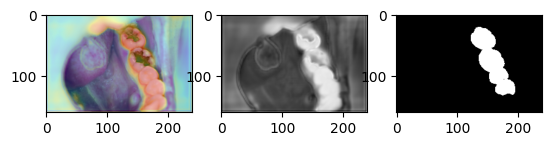

Ineference Time :  0.1750443000055384


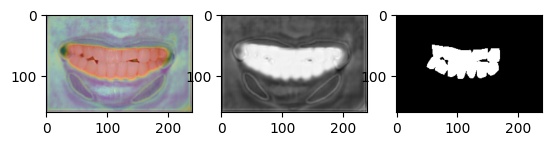

Ineference Time :  0.1610699000011664


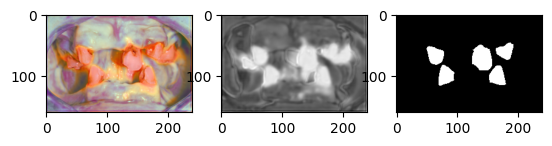

Ineference Time :  0.21821969999291468


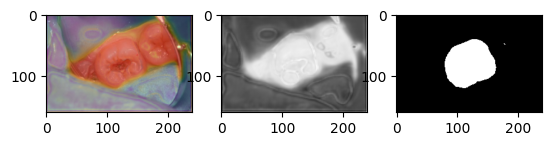

Ineference Time :  0.160189200003515


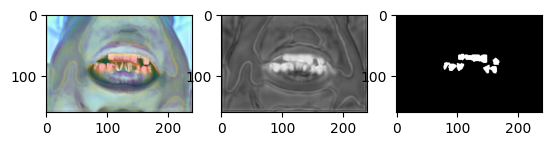

Ineference Time :  0.16905769999721088


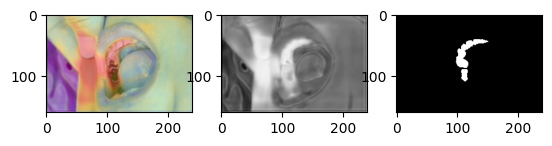

Ineference Time :  0.1717413000005763


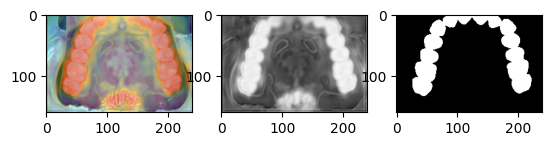

Ineference Time :  0.19000570000207517


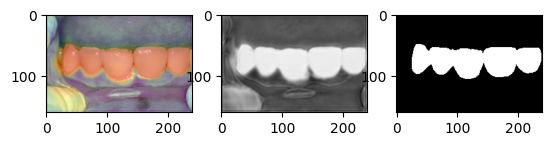

Ineference Time :  0.1837734000000637


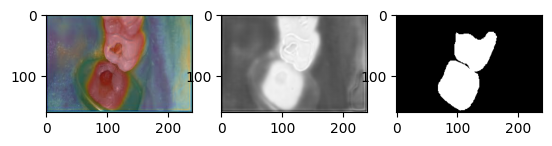

Ineference Time :  0.16938910000317264


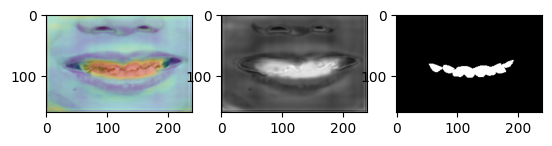

Ineference Time :  0.1698030999978073


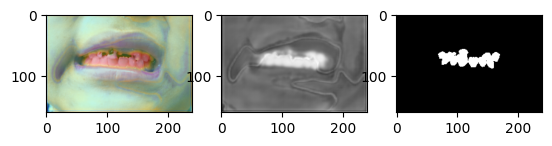

Ineference Time :  0.1694541000033496


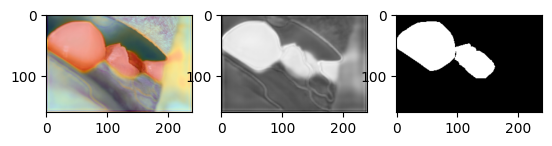

Ineference Time :  0.2063732000096934


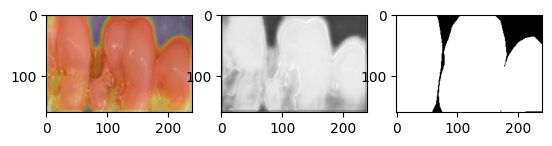

Ineference Time :  0.1652539000060642


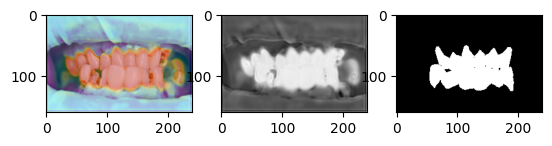

Ineference Time :  0.16355319999274798


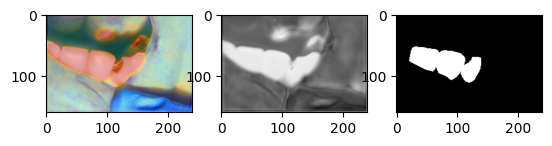

Ineference Time :  0.1660323999967659


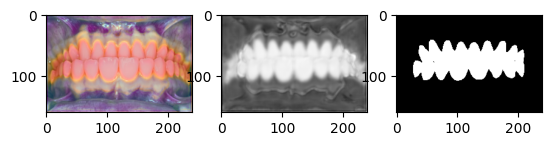

Ineference Time :  0.17462800000794232


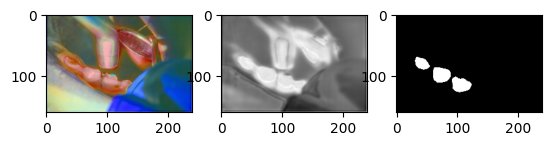

Ineference Time :  0.1699763999931747


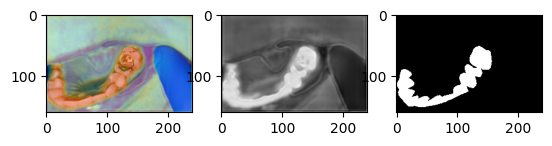

Ineference Time :  0.19227529999625403


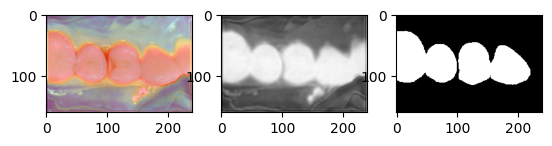

Ineference Time :  0.16624799999408424


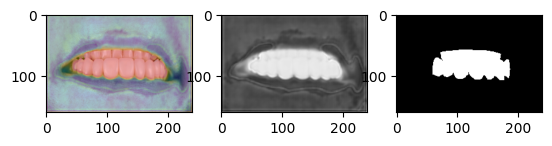

Ineference Time :  0.19333480000204872


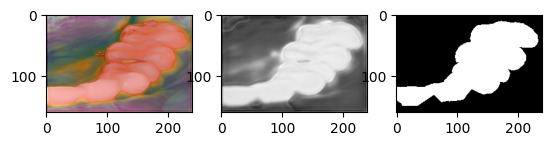

Ineference Time :  0.17605270000058226


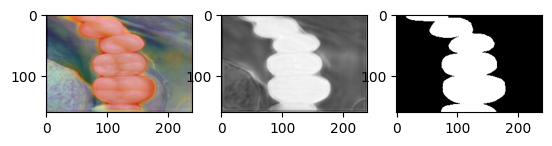

Ineference Time :  0.1690909000026295


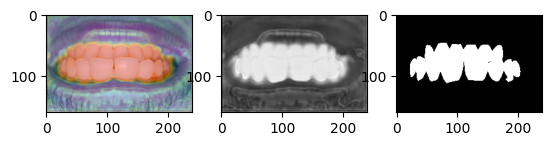

Ineference Time :  0.16716209999867715


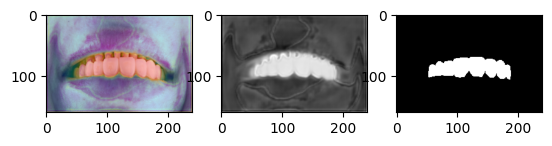

Ineference Time :  0.17731240000284743


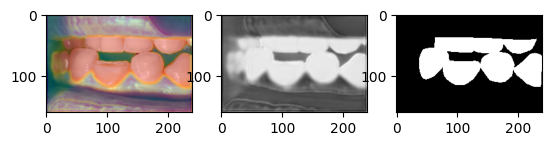

Ineference Time :  0.19302190000598785


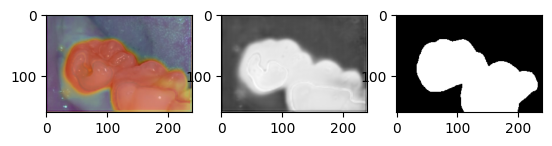

Ineference Time :  0.20183859999815468


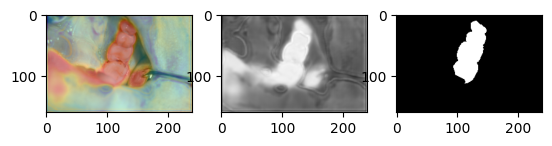

In [10]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import timeit

with open("model_weights30.pth", 'rb') as file:
    weights = torch.load(file, map_location='cpu')
    model = UNET()
    weights = state_dict = {k.replace('module.', ''): v for k, v in weights.items()}
    model.load_state_dict(weights)
    model.to('cpu')


model.eval()
for img, mask in test_data:
    with torch.inference_mode():
        t1 = timeit.default_timer()
        
        output = model(img.unsqueeze(0))

        t2 = timeit.default_timer()
        dt = t2-t1
        print("Ineference Time : ",  dt)

        plt.subplot(1, 3, 1)
        plt.imshow(img.permute(1, 2, 0))
        plt.imshow(output.squeeze(), cmap='jet', alpha=0.3)

        plt.subplot(1, 3, 2)
        plt.imshow(output.squeeze(), cmap=plt.cm.gray)

        plt.subplot(1, 3, 3)
        plt.imshow(mask.squeeze(), cmap=plt.cm.gray)
        plt.show()